In [4]:
import pandas as pd
import numpy as np
from pathlib import Path
import boto3
import pickle
import sagemaker
from sagemaker import get_execution_role
import matplotlib.pyplot as plt
from fastai.vision import *

In [2]:
!ls 

1.  Explore Data.ipynb	lost+found  Model Prediction.ipynb  planesnet_dict.pkl


In [3]:
# copy model from s3 bucket
!mkdir /tmp/models/
!aws s3 cp s3://planesnet-sagemaker/data/trained_res18_planesnet_20pix.pkl /tmp/models/

download: s3://planesnet-sagemaker/data/trained_res18_planesnet_20pix.pkl to ../../../tmp/models/trained_res18_planesnet_20pix.pkl


In [4]:
!mkdir /tmp/test_images/
!aws s3 cp s3://planesnet-sagemaker/data/test_images/ /tmp/test_images/ --recursive

download: s3://planesnet-sagemaker/data/test_images/scene_4.png to ../../../tmp/test_images/scene_4.png
download: s3://planesnet-sagemaker/data/test_images/scene_2.png to ../../../tmp/test_images/scene_2.png
download: s3://planesnet-sagemaker/data/test_images/scene_3.png to ../../../tmp/test_images/scene_3.png
download: s3://planesnet-sagemaker/data/test_images/plane_scene_1.png to ../../../tmp/test_images/plane_scene_1.png


In [5]:
!ls 

1.  Explore Data.ipynb	lost+found  Model Prediction.ipynb  planesnet_dict.pkl


In [6]:
PATH = Path('/tmp/')

In [7]:
!pwd

/home/ec2-user/SageMaker


In [ ]:
!ls 

In [8]:
# load in the previously trained model

In [5]:
learner = load_learner('/tmp/models/','trained_res18_planesnet_20pix.pkl')

In [18]:
learner.predict()

ImageDataBunch;

Train: LabelList (0 items)
x: ImageList

y: CategoryList

Path: /tmp/models;

Valid: LabelList (0 items)
x: ImageList

y: CategoryList

Path: /tmp/models;

Test: None

In [19]:
# load in training a validation data
# copy from s3
!aws s3 cp s3://planesnet-sagemaker/data/planesnet_dict.pkl planesnet_dict.pkl 
    
f = open('planesnet_dict.pkl','rb')
image_dict = pickle.load(f)
f.close()

image_pd = pd.DataFrame.from_dict(image_dict, orient='index')
image_pd['filename'] = image_pd.index
classification_pd = image_pd[['filename','class_label']]
classification_pd.reset_index(drop=True,inplace=True)


download: s3://planesnet-sagemaker/data/planesnet_dict.pkl to ./planesnet_dict.pkl


In [23]:

bs = 128
size = 20
tfms = get_transforms(flip_vert=True,max_rotate=90)
data = ImageDataBunch.from_df('/tmp/temp_images/',classification_pd,ds_tfms=tfms,size=size,bs=bs)

In [28]:
a = data.train_ds[0][0]

In [29]:
a

In [31]:
b = a.data

In [33]:
b.shape

torch.Size([3, 20, 20])

In [36]:
b.mean(dim=0)

tensor([[0.7353, 0.7218, 0.7187, 0.7163, 0.7108, 0.7055, 0.7054, 0.7240, 0.7172,
         0.7054, 0.7093, 0.7228, 0.7354, 0.7392, 0.7283, 0.7463, 0.7623, 0.7646,
         0.7522, 0.7424],
        [0.7298, 0.7232, 0.7147, 0.7147, 0.7160, 0.7099, 0.7055, 0.7227, 0.7192,
         0.7084, 0.7098, 0.7197, 0.7319, 0.7426, 0.7507, 0.7627, 0.7729, 0.7813,
         0.7864, 0.7777],
        [0.7382, 0.7226, 0.7239, 0.7206, 0.7058, 0.6992, 0.7124, 0.7525, 0.7520,
         0.7286, 0.7173, 0.7194, 0.7318, 0.7541, 0.7848, 0.7814, 0.7802, 0.7895,
         0.8025, 0.7933],
        [0.7417, 0.7321, 0.7336, 0.7328, 0.7264, 0.7236, 0.7266, 0.7357, 0.7369,
         0.7365, 0.7413, 0.7458, 0.7479, 0.7499, 0.7524, 0.7553, 0.7556, 0.7541,
         0.7528, 0.7619],
        [0.7418, 0.7430, 0.7389, 0.7402, 0.7460, 0.7462, 0.7393, 0.7261, 0.7325,
         0.7451, 0.7423, 0.7450, 0.7588, 0.7686, 0.7552, 0.7641, 0.7680, 0.7608,
         0.7461, 0.7476],
        [0.7456, 0.7491, 0.7440, 0.7429, 0.7473, 0.7483, 0.7

In [38]:
learner.data.batch_size

64

In [44]:
# read in a new image
img = open_image('/tmp/test_images/plane_scene_1.png')


In [ ]:
Image()

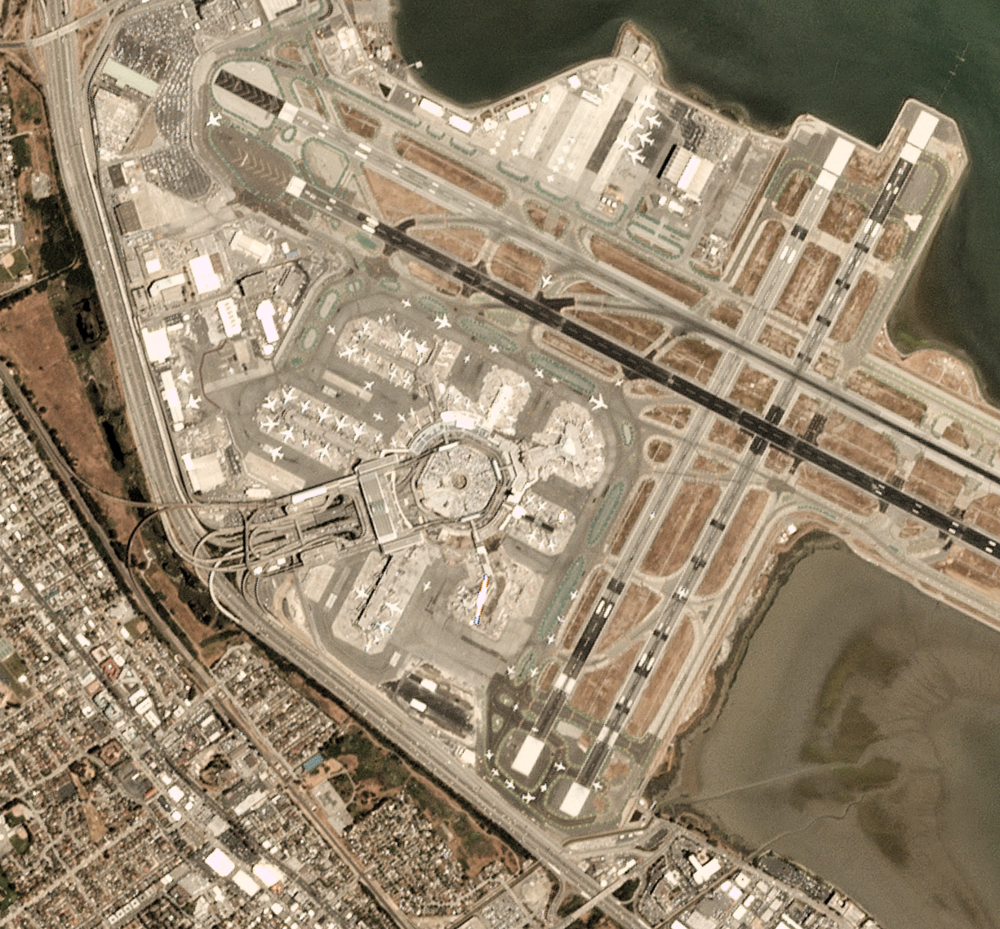

In [34]:
img

In [84]:
temp = img.crop([100,100,200,200])

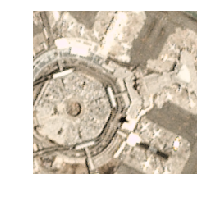

In [85]:
temp.show()

In [39]:
c = img.data.clone()

In [56]:
im2 = img.crop((0,0,100,100))

In [59]:
im2.data.shape

torch.Size([3, 100, 100])

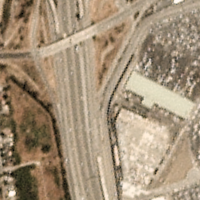

In [45]:
Image(img.data[:,0:200,0:200])

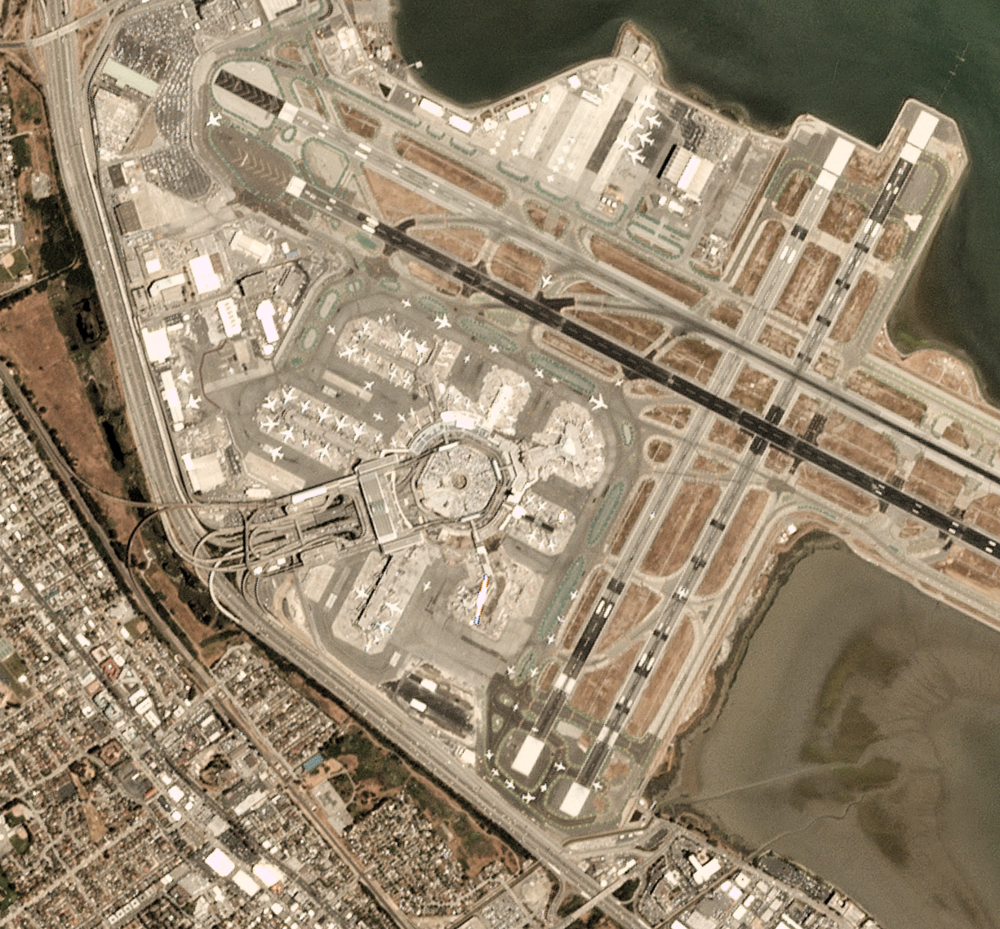

In [46]:
img

In [62]:
a = learner.predict(img)[1]

In [64]:
def look_for_aircraft_sliding_window(model,image):
    
    # sliding window 
    window = 20
    step = 2
    
    # load model
    learner = load_learner('/tmp/models/','trained_res18_planesnet_20pix.pkl')
    
    # load image
    img = open_image(image,div=False)
    img_data = img.data  # shape is channel x height x width
    
    detected = np.zeros((img.shape[1],img.shape[2]))
    out_data = img_data.clone()
    
    # now loop over the image
    for i in range(0, img.shape[1]-window, step):  # loop over rows of image

        for j in range(0,img.shape[2]-window, step):  # loop over columns of image
            temp_window = img_data[:,i:i+window,j:j+window]
            temp_image = Image(temp_window.div(255))
            #temp_image = Image(pil2tensor(temp_window,np.float32).div(255))
            #print(temp_image.shape)
            #print(temp_image.data)
            # predict from models
            temp_predict = learner.predict(temp_image)
            
            #print(temp_predict)
            # check for aircraft in the window
            if temp_predict[1] == 1:
                print('found one!  ',str(i),str(j))
                detected[i+int(window/2),j+int(window/2)] = 1
                
    return detected


In [65]:
d = look_for_aircraft_sliding_window(learner,'/tmp/test_images/plane_scene_1.png')

found one!   40 240
found one!   42 240
found one!   68 780
found one!   70 778
found one!   70 780
found one!   72 444
found one!   72 780
found one!   74 444
found one!   96 730
found one!   96 732
found one!   98 728
found one!   98 730
found one!   98 732
found one!   98 734
found one!   100 730
found one!   100 732
found one!   100 734
found one!   102 730
found one!   102 732
found one!   102 734
found one!   114 778
found one!   114 780
found one!   114 782
found one!   116 778
found one!   116 780
found one!   116 782
found one!   116 784
found one!   118 780
found one!   118 782
found one!   118 784
found one!   120 780
found one!   128 138
found one!   134 250
found one!   134 252
found one!   134 254
found one!   134 788
found one!   136 250
found one!   136 252
found one!   136 254
found one!   136 788
found one!   136 790
found one!   136 792
found one!   138 250
found one!   138 252
found one!   138 254
found one!   138 788
found one!   138 790
found one!   138 792
found 

found one!   480 344
found one!   480 548
found one!   480 550
found one!   480 552
found one!   482 226
found one!   482 228
found one!   482 320
found one!   482 322
found one!   482 548
found one!   482 550
found one!   482 552
found one!   482 722
found one!   482 724
found one!   482 726
found one!   482 728
found one!   484 224
found one!   484 226
found one!   484 228
found one!   484 320
found one!   484 322
found one!   484 324
found one!   484 366
found one!   484 562
found one!   484 564
found one!   484 720
found one!   484 722
found one!   484 724
found one!   484 726
found one!   484 728
found one!   486 226
found one!   486 228
found one!   486 320
found one!   486 322
found one!   486 324
found one!   486 364
found one!   486 366
found one!   486 562
found one!   486 564
found one!   486 566
found one!   486 578
found one!   486 580
found one!   486 722
found one!   486 724
found one!   486 726
found one!   488 320
found one!   488 322
found one!   488 324
found one!   

found one!   714 430
found one!   714 432
found one!   714 434
found one!   714 556
found one!   714 558
found one!   716 430
found one!   716 432
found one!   716 434
found one!   716 826
found one!   718 430
found one!   718 432
found one!   718 434
found one!   718 692
found one!   718 694
found one!   718 824
found one!   718 826
found one!   720 432
found one!   720 434
found one!   720 692
found one!   720 694
found one!   720 826
found one!   728 316
found one!   732 470
found one!   732 472
found one!   734 470
found one!   734 472
found one!   734 474
found one!   736 468
found one!   736 470
found one!   736 472
found one!   736 474
found one!   738 472
found one!   738 474
found one!   756 458
found one!   756 460
found one!   756 462
found one!   758 458
found one!   758 460
found one!   758 462
found one!   760 458
found one!   760 460
found one!   760 462
found one!   762 460
found one!   762 462
found one!   768 598
found one!   772 452
found one!   772 666
found one!   

KeyboardInterrupt: 

In [71]:
d.argmax()

0

In [70]:
def chunk_up_image(image):
    
    # sliding window 
    window = 20
    step = 2

    # load image
    img = open_image(image)
    img_data = img.data  # shape is channel x height x width

    # now loop over the image
    for i in range(0, img.shape[1]-window, step):  # loop over rows of image
        print(i)
        for j in range(0,img.shape[2]-window, step):  # loop over columns of image
            temp_window = img_data[:,i:i+window,j:j+window]
            temp_image = Image(temp_window)
            temp_image.save('/tmp/test_images/'+'temp.'+str(i)+'.'+str(j)+'.jpg')
    return

In [71]:
chunk_up_image('/tmp/test_images/plane_scene_1.png')

0
2
4
6
8
10
12
14
16
18
20
22
24
26
28
30
32
34
36
38
40
42
44
46
48
50
52
54
56
58
60
62
64
66
68
70
72
74
76
78
80
82
84
86
88
90
92
94
96
98
100
102
104
106
108
110
112
114
116
118
120
122
124
126
128
130
132
134
136
138
140
142
144
146
148
150
152
154
156
158
160
162
164
166
168
170
172
174
176
178
180
182
184
186
188
190
192
194
196
198
200
202
204
206
208
210
212
214
216
218
220
222
224
226
228
230
232
234
236
238
240
242
244
246
248
250
252
254
256
258
260
262
264
266
268
270
272
274
276
278
280
282
284
286
288
290
292
294
296
298
300
302
304
306
308
310
312
314
316
318
320
322
324
326
328
330
332
334
336
338
340
342
344
346
348
350
352
354
356
358
360
362
364
366
368
370
372
374
376
378
380
382
384
386
388
390
392
394
396
398
400
402
404
406
408
410
412
414
416
418
420
422
424
426
428
430
432
434
436
438
440
442
444
446
448
450
452
454
456
458
460
462
464
466
468
470
472
474
476
478
480
482
484
486
488
490
492
494
496
498
500
502
504
506
508
510
512
514
516
518
520
522
524
526

In [72]:
!ls /tmp/test_images/

plane_scene_1.png   temp.242.184.jpg   temp.494.1056.jpg  temp.746.28.jpg
scene_2.png	    temp.242.186.jpg   temp.494.1058.jpg  temp.746.290.jpg
scene_3.png	    temp.242.188.jpg   temp.494.1060.jpg  temp.746.292.jpg
scene_4.png	    temp.24.218.jpg    temp.494.1062.jpg  temp.746.294.jpg
temp.0.0.jpg	    temp.242.18.jpg    temp.494.1064.jpg  temp.746.296.jpg
temp.0.1000.jpg     temp.242.190.jpg   temp.494.1066.jpg  temp.746.298.jpg
temp.0.1002.jpg     temp.242.192.jpg   temp.494.1068.jpg  temp.74.62.jpg
temp.0.1004.jpg     temp.242.194.jpg   temp.494.106.jpg   temp.746.2.jpg
temp.0.1006.jpg     temp.242.196.jpg   temp.494.1070.jpg  temp.746.300.jpg
temp.0.1008.jpg     temp.242.198.jpg   temp.494.1072.jpg  temp.746.302.jpg
temp.0.100.jpg	    temp.242.200.jpg   temp.494.1074.jpg  temp.746.304.jpg
temp.0.1010.jpg     temp.242.202.jpg   temp.494.1076.jpg  temp.746.306.jpg
temp.0.1012.jpg     temp.242.204.jpg   temp.494.1078.jpg  temp.746.308.jpg
temp.0.1014.jpg     temp.242.206.jpg   temp.49

temp.1000.1014.jpg  temp.244.1080.jpg  temp.496.1060.jpg  temp.748.128.jpg
temp.1000.1016.jpg  temp.244.1082.jpg  temp.496.1062.jpg  temp.74.812.jpg
temp.1000.1018.jpg  temp.244.1084.jpg  temp.496.1064.jpg  temp.748.12.jpg
temp.1000.1020.jpg  temp.244.1086.jpg  temp.496.1066.jpg  temp.748.130.jpg
temp.1000.1022.jpg  temp.244.1088.jpg  temp.496.1068.jpg  temp.748.132.jpg
temp.1000.1024.jpg  temp.244.108.jpg   temp.496.106.jpg   temp.748.134.jpg
temp.1000.1026.jpg  temp.244.1090.jpg  temp.496.1070.jpg  temp.748.136.jpg
temp.1000.1028.jpg  temp.244.1092.jpg  temp.496.1072.jpg  temp.748.138.jpg
temp.1000.102.jpg   temp.244.1094.jpg  temp.496.1074.jpg  temp.748.140.jpg
temp.1000.1030.jpg  temp.244.1096.jpg  temp.496.1076.jpg  temp.748.142.jpg
temp.1000.1032.jpg  temp.244.1098.jpg  temp.496.1078.jpg  temp.748.144.jpg
temp.1000.1034.jpg  temp.24.410.jpg    temp.496.1080.jpg  temp.748.146.jpg
temp.1000.1036.jpg  temp.244.10.jpg    temp.496.1082.jpg  temp.748.148.jpg
temp.1000.1038.jpg  temp.24

temp.1012.766.jpg   temp.258.312.jpg   temp.50.988.jpg	  temp.762.642.jpg
temp.1012.768.jpg   temp.258.314.jpg   temp.50.98.jpg	  temp.762.644.jpg
temp.1012.76.jpg    temp.258.316.jpg   temp.50.990.jpg	  temp.762.646.jpg
temp.1012.770.jpg   temp.258.318.jpg   temp.50.992.jpg	  temp.762.648.jpg
temp.1012.772.jpg   temp.258.320.jpg   temp.50.994.jpg	  temp.76.264.jpg
temp.1012.774.jpg   temp.258.322.jpg   temp.50.996.jpg	  temp.762.64.jpg
temp.1012.776.jpg   temp.258.324.jpg   temp.50.998.jpg	  temp.762.650.jpg
temp.1012.778.jpg   temp.258.326.jpg   temp.510.0.jpg	  temp.762.652.jpg
temp.1012.780.jpg   temp.258.328.jpg   temp.510.1000.jpg  temp.762.654.jpg
temp.1012.782.jpg   temp.258.32.jpg    temp.510.1002.jpg  temp.762.656.jpg
temp.1012.784.jpg   temp.258.330.jpg   temp.510.1004.jpg  temp.762.658.jpg
temp.1012.786.jpg   temp.258.332.jpg   temp.510.1006.jpg  temp.762.660.jpg
temp.1012.788.jpg   temp.258.334.jpg   temp.510.1008.jpg  temp.762.662.jpg
temp.1012.78.jpg    temp.258.336.jpg 

temp.1026.746.jpg   temp.272.1052.jpg  temp.52.426.jpg	  temp.776.784.jpg
temp.1026.748.jpg   temp.272.1054.jpg  temp.524.26.jpg	  temp.776.786.jpg
temp.102.674.jpg    temp.272.1056.jpg  temp.524.270.jpg   temp.776.788.jpg
temp.1026.74.jpg    temp.272.1058.jpg  temp.524.272.jpg   temp.776.78.jpg
temp.1026.750.jpg   temp.272.1060.jpg  temp.524.274.jpg   temp.776.790.jpg
temp.1026.752.jpg   temp.272.1062.jpg  temp.524.276.jpg   temp.776.792.jpg
temp.1026.754.jpg   temp.272.1064.jpg  temp.524.278.jpg   temp.776.794.jpg
temp.1026.756.jpg   temp.272.1066.jpg  temp.524.280.jpg   temp.776.796.jpg
temp.1026.758.jpg   temp.272.1068.jpg  temp.524.282.jpg   temp.776.798.jpg
temp.1026.760.jpg   temp.272.106.jpg   temp.524.284.jpg   temp.776.800.jpg
temp.1026.762.jpg   temp.272.1070.jpg  temp.524.286.jpg   temp.776.802.jpg
temp.1026.764.jpg   temp.272.1072.jpg  temp.524.288.jpg   temp.776.804.jpg
temp.1026.766.jpg   temp.272.1074.jpg  temp.52.428.jpg	  temp.776.806.jpg
temp.1026.768.jpg   temp.272.

temp.1042.1184.jpg  temp.286.328.jpg   temp.538.912.jpg   temp.790.916.jpg
temp.1042.1186.jpg  temp.28.632.jpg    temp.538.914.jpg   temp.790.918.jpg
temp.1042.1188.jpg  temp.286.32.jpg    temp.538.916.jpg   temp.790.920.jpg
temp.1042.118.jpg   temp.286.330.jpg   temp.538.918.jpg   temp.790.922.jpg
temp.1042.1190.jpg  temp.286.332.jpg   temp.538.920.jpg   temp.790.924.jpg
temp.1042.1192.jpg  temp.286.334.jpg   temp.538.922.jpg   temp.790.926.jpg
temp.1042.1194.jpg  temp.286.336.jpg   temp.538.924.jpg   temp.790.928.jpg
temp.1042.1196.jpg  temp.286.338.jpg   temp.538.926.jpg   temp.790.92.jpg
temp.1042.1198.jpg  temp.286.340.jpg   temp.538.928.jpg   temp.790.930.jpg
temp.1042.1200.jpg  temp.286.342.jpg   temp.538.92.jpg	  temp.790.932.jpg
temp.1042.1202.jpg  temp.286.344.jpg   temp.538.930.jpg   temp.790.934.jpg
temp.1042.1204.jpg  temp.286.346.jpg   temp.538.932.jpg   temp.790.936.jpg
temp.1042.120.jpg   temp.286.348.jpg   temp.538.934.jpg   temp.790.938.jpg
temp.1042.122.jpg   temp.28

temp.1056.154.jpg   temp.300.808.jpg   temp.552.810.jpg   temp.806.1200.jpg
temp.1056.156.jpg   temp.300.80.jpg    temp.552.812.jpg   temp.806.1202.jpg
temp.1056.158.jpg   temp.300.810.jpg   temp.552.814.jpg   temp.806.1204.jpg
temp.1056.160.jpg   temp.300.812.jpg   temp.552.816.jpg   temp.806.120.jpg
temp.1056.162.jpg   temp.300.814.jpg   temp.552.818.jpg   temp.806.122.jpg
temp.1056.164.jpg   temp.300.816.jpg   temp.552.820.jpg   temp.806.124.jpg
temp.1056.166.jpg   temp.300.818.jpg   temp.552.822.jpg   temp.806.126.jpg
temp.1056.168.jpg   temp.300.820.jpg   temp.552.824.jpg   temp.806.128.jpg
temp.1056.16.jpg    temp.300.822.jpg   temp.552.826.jpg   temp.80.612.jpg
temp.1056.170.jpg   temp.300.824.jpg   temp.552.828.jpg   temp.806.12.jpg
temp.1056.172.jpg   temp.300.826.jpg   temp.552.82.jpg	  temp.806.130.jpg
temp.1056.174.jpg   temp.300.828.jpg   temp.552.830.jpg   temp.806.132.jpg
temp.1056.176.jpg   temp.300.82.jpg    temp.552.832.jpg   temp.806.134.jpg
temp.1056.178.jpg   temp.

temp.1070.142.jpg   temp.314.934.jpg   temp.568.1124.jpg  temp.820.650.jpg
temp.1070.144.jpg   temp.314.936.jpg   temp.568.1126.jpg  temp.820.652.jpg
temp.1070.146.jpg   temp.314.938.jpg   temp.568.1128.jpg  temp.820.654.jpg
temp.1070.148.jpg   temp.314.940.jpg   temp.568.112.jpg   temp.820.656.jpg
temp.1070.14.jpg    temp.314.942.jpg   temp.568.1130.jpg  temp.820.658.jpg
temp.1070.150.jpg   temp.314.944.jpg   temp.568.1132.jpg  temp.820.660.jpg
temp.1070.152.jpg   temp.314.946.jpg   temp.568.1134.jpg  temp.820.662.jpg
temp.1070.154.jpg   temp.314.948.jpg   temp.568.1136.jpg  temp.820.664.jpg
temp.1070.156.jpg   temp.314.94.jpg    temp.568.1138.jpg  temp.820.666.jpg
temp.1070.158.jpg   temp.314.950.jpg   temp.568.1140.jpg  temp.820.668.jpg
temp.1070.160.jpg   temp.314.952.jpg   temp.568.1142.jpg  temp.820.66.jpg
temp.1070.162.jpg   temp.314.954.jpg   temp.568.1144.jpg  temp.820.670.jpg
temp.1070.164.jpg   temp.314.956.jpg   temp.568.1146.jpg  temp.820.672.jpg
temp.1070.166.jpg   temp.3

temp.1084.288.jpg   temp.32.876.jpg    temp.58.232.jpg	  temp.834.224.jpg
temp.108.428.jpg    temp.328.76.jpg    temp.582.32.jpg	  temp.834.226.jpg
temp.1084.28.jpg    temp.328.770.jpg   temp.582.330.jpg   temp.834.228.jpg
temp.1084.290.jpg   temp.328.772.jpg   temp.582.332.jpg   temp.834.22.jpg
temp.1084.292.jpg   temp.328.774.jpg   temp.582.334.jpg   temp.834.230.jpg
temp.1084.294.jpg   temp.328.776.jpg   temp.582.336.jpg   temp.834.232.jpg
temp.1084.296.jpg   temp.328.778.jpg   temp.582.338.jpg   temp.834.234.jpg
temp.1084.298.jpg   temp.328.780.jpg   temp.582.340.jpg   temp.834.236.jpg
temp.10.842.jpg     temp.328.782.jpg   temp.582.342.jpg   temp.834.238.jpg
temp.108.42.jpg     temp.328.784.jpg   temp.582.344.jpg   temp.834.240.jpg
temp.1084.2.jpg     temp.328.786.jpg   temp.582.346.jpg   temp.834.242.jpg
temp.1084.300.jpg   temp.328.788.jpg   temp.582.348.jpg   temp.834.244.jpg
temp.1084.302.jpg   temp.32.878.jpg    temp.58.234.jpg	  temp.834.246.jpg
temp.1084.304.jpg   temp.328.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [73]:
data = ImageList.from_folder('/tmp/test_images/')

In [74]:
learn = load_learner('/tmp/models/','trained_res18_planesnet_20pix.pkl', test=data)

In [75]:
y,z = learn.get_preds(DatasetType.Test)

In [76]:
y

tensor([[9.9725e-01, 2.7470e-03],
        [9.9859e-01, 1.4143e-03],
        [9.9848e-01, 1.5178e-03],
        ...,
        [9.9960e-01, 3.9971e-04],
        [9.9966e-01, 3.4013e-04],
        [9.9923e-01, 7.6564e-04]])

In [77]:
z

tensor([0, 0, 0,  ..., 0, 0, 0])